---

<h1 style="color:#012eba">Introduction to Image Processing with Python</h1>
<h1 style="color:#012eba">Episode 2: Image Enhancements, Part 3. Histogram Manipulation</h1>

---

*DASCI 261 - Introduction to Image Processing*

*Prepared by Erika G. Lacson*

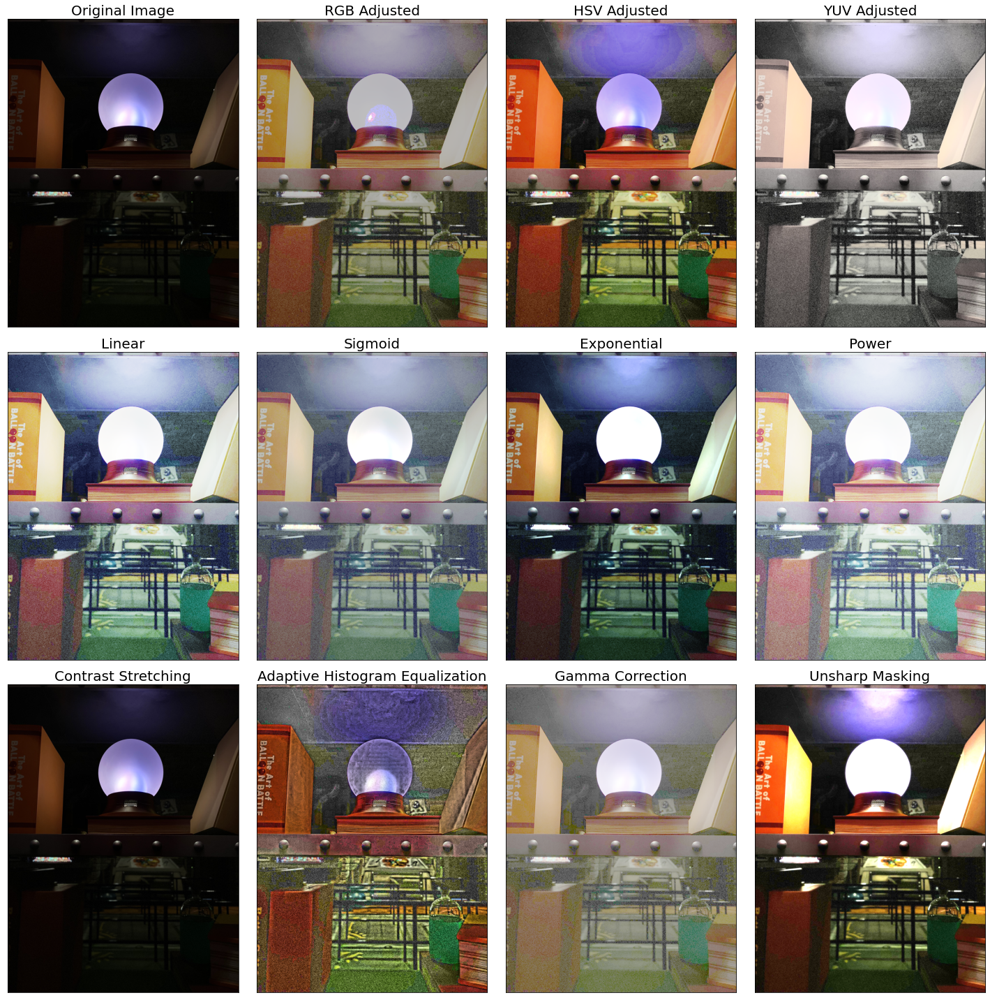

Histogram Manipulation Techniques. Photo by Author

---
<h2 style="color:#ff0090">Introduction</h2>

Welcome back to the third part of the second episode of our image processing series! In the previous parts of the series, we discussed the Fourier Transform and White Balancing techniques, and now we will be exploring another exciting technique called Histogram Manipulation.

If you’re like me, you might be wondering how a histogram can be manipulated. I mean, isn’t a histogram just a graph that shows the distribution of pixel values in an image? Well, it turns out that by manipulating the histogram, we can adjust the contrast and brightness of an image, which can greatly improve its visual appearance.

So, let’s dive into the world of histogram manipulation and discover how we can enhance our images’ contrast and brightness using various Histogram Manipulation Techniques. These techniques can be used to improve the visibility of objects in low-light images, to improve the details of an image, and to correct over or underexposed images.

Let’s begin by importing relevant python libraries:

#### Step 1: Import libraries, then load and display the image

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.color import rgb2gray
from skimage.exposure import histogram, cumulative_distribution
from skimage import filters
from skimage.color import rgb2hsv, rgb2gray, rgb2yuv
from skimage import color, exposure, transform
from skimage.exposure import histogram, cumulative_distribution

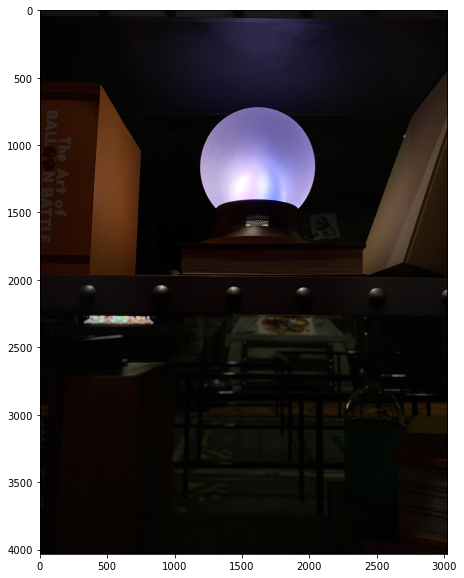

In [4]:
# Load the image & remove the alpha or opacity channel (transparency) 
dark_image = imread('plasma_ball.png')[:,:,:3]

# Visualize the image
plt.figure(figsize=(10, 10))
# plt.title('Original Image: Plasma Ball')
plt.imshow(dark_image)
plt.show()

Output #1: Photo by Author

#### Step 2: Check the channel statistics & plot histogram of the image

In [7]:
calc_color_overcast(dark_image)

,Mean,Std,Min,Median,P_80,P_90,P_99,Max
Red,25.676231,38.246267,0.0,12.0,34.0,69.0,194.0,255.0
Green,19.892807,33.691716,0.0,9.0,22.0,46.0,183.0,255.0
Blue,19.758817,43.684075,0.0,6.0,20.0,44.0,244.0,255.0


Output #2: Pandas DataFrame of the Channel Statistics of the Image. Photo by Author.

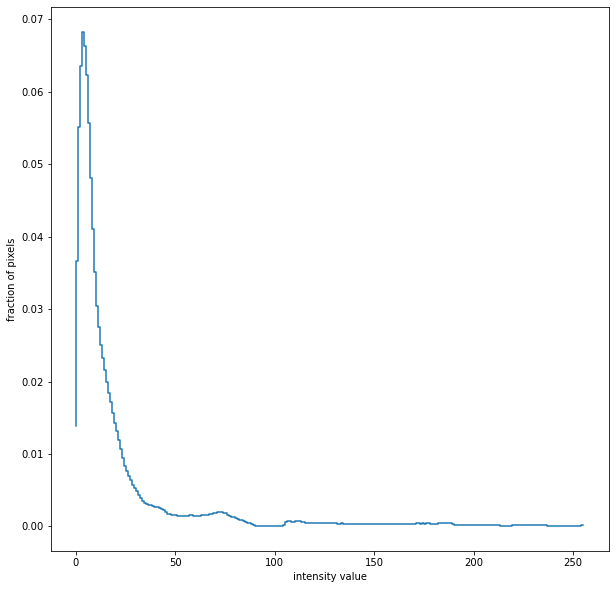

In [8]:
# Histogram plot
dark_image_intensity = img_as_ubyte(rgb2gray(dark_image))
freq, bins = histogram(dark_image_intensity)
plt.figure(figsize=(10, 10))
plt.step(bins, freq*1.0/freq.sum())
plt.xlabel('intensity value')
plt.ylabel('fraction of pixels');

Output #3: Histogram Plot of the Intensity Values of the Image. Photo by Author.

There seems to be no significant overcast but the mean intensity of the pixels seem extremely low, confirming the dark image and under-exposed visualization of the image. The histogram shows that most pixels have <b>low intensity values</b>, which makes sense since low pixel intensity values mean that most pixels are very dark or black in an image. We can apply various histogram manipulation techniques to the image to improve its contrast.

#### Step 3: Explore various Histogram Manipulation Techniques

Before we dive into the several techniques in histogram manipulation, let’s understand the commonly used histogram manipulation technique called histogram equalization.

<b>Histogram equalization</b> is a technique that redistributes the pixel intensities in an image to make the histogram more uniform. A non-uniform pixel intensity distribution can result in an image with low contrast and detail, making it difficult to distinguish objects or features within the image. By making the pixel intensity distribution more uniform, the contrast of the image is improved, making it easier to perceive details and features.

One way to achieve a uniform pixel intensity distribution is to make the *cumulative distribution function (CDF)* of the image *linear*. This is because a linear CDF implies that each pixel intensity value is equally likely to occur in the image. A *non-linear CDF*, on the other hand, implies that *certain pixel intensity values occur more frequently than others, resulting in a non-uniform pixel intensity distribution*. By making the CDF linear, we can make the pixel intensity distribution more uniform and improve the image contrast.

In [9]:
def plot_cdf(image):
    """
    Plot the cumulative distribution function of an image.
    
    Parameters:
    image (ndarray): Input image.
    """
    
    # Convert the image to grayscale if needed
    if len(image.shape) == 3:
        image = rgb2gray(image[:,:,:3])
    
    # Compute the cumulative distribution function
    intensity = np.round(image * 255).astype(np.uint8)
    freq, bins = cumulative_distribution(intensity)
    
    # Plot the actual and target CDFs
    plt.figure(figsize=(10, 10))
    target_bins = np.arange(256)
    target_freq = np.linspace(0, 1, len(target_bins))
    plt.step(bins, freq, c='b', label='Actual CDF')
    plt.plot(target_bins, target_freq, c='r', label='Target CDF')
    
    # Plot an example lookup
    example_intensity = 50
    example_target = np.interp(freq[example_intensity], target_freq, target_bins)
    plt.plot([example_intensity, example_intensity, target_bins[-11], target_bins[-11]],
             [0, freq[example_intensity], freq[example_intensity], 0], 
             'k--', 
             label=f'Example lookup ({example_intensity} -> {example_target:.0f})')
    
    # Customize the plot
    plt.legend()
    plt.xlim(0, 255)
    plt.ylim(0, 1)
    plt.xlabel('Intensity Values')
    plt.ylabel('Cumulative Fraction of Pixels')
    plt.title('Cumulative Distribution Function')
    
    return freq, bins, target_freq, target_bins

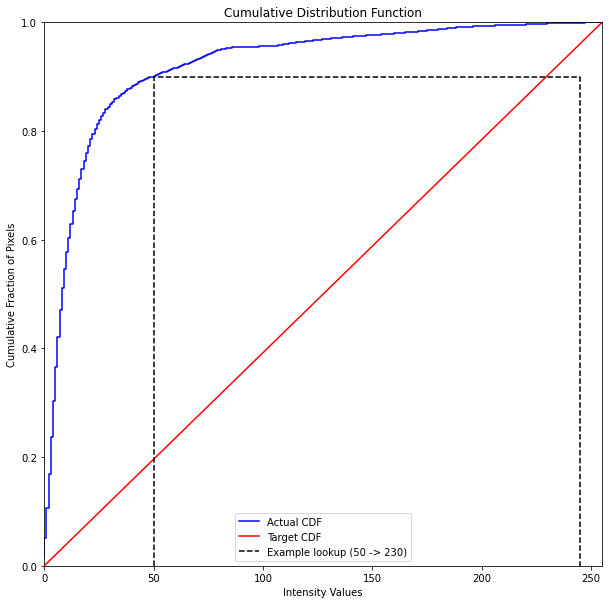

In [10]:
# dark_image = imread('plasma_ball.png')

freq, bins, target_freq, target_bins = plot_cdf(dark_image);

Output #4: CDF Plot

The code computes the cumulative distribution function (CDF) of the dark image and then defines a target CDF based on a linear distribution. It then plots the actual CDF of the dark image in blue and the target CDF (linear) in red. An example lookup of an intensity value is also plotted which shows that the actual CDF is 50 in the example and we want to target it to be 230.

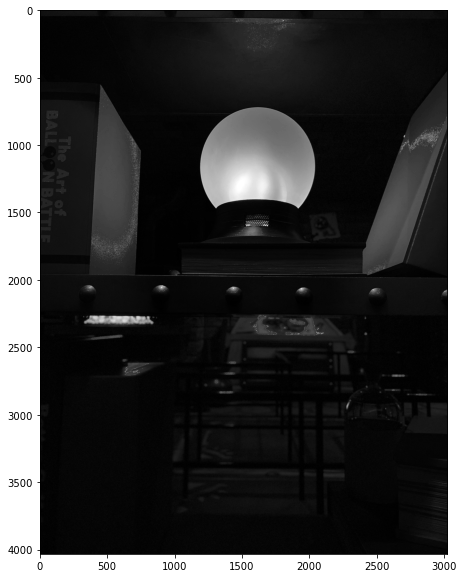

In [11]:
# Sample conversion of intensity values from actual value of 50 to target value of 230
dark_image_230 = dark_image_intensity.copy()
dark_image_230[dark_image_230==50] = 230
plt.figure(figsize=(10,10))
plt.imshow(dark_image_230,cmap='gray');

Output #5: Sample gray image result based on the conversion of actual intensity value (50) to target value (230). Photo by Author.

After obtaining the target CDF, the next step is to compute the intensity values to be used in replacing the original pixel intensities. This is done using interpolation to create a lookup table.

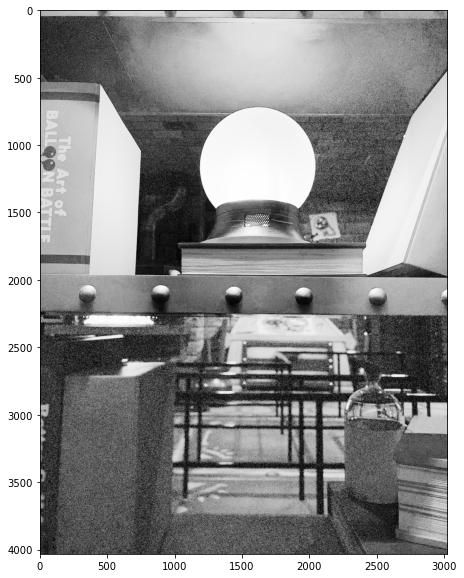

In [13]:
# Display the result after replacing all actual values to target values
new_vals = np.interp(freq, target_freq, target_bins)
dark_image_eq = img_as_ubyte(new_vals[img_as_ubyte(rgb2gray(dark_image[:,:,:3]))].astype(int))
plt.figure(figsize=(10,10))
plt.imshow(dark_image_eq, cmap='gray');

Output #6: Sample gray image result based on the conversion of all actual intensity values to target values. Photo by Author.

The `np.interp()` function computes the intensity values to be used in replacing the original pixel intensities by interpolating between the actual and target CDFs. The resulting intensity values are then used to replace the original pixel intensities using NumPy indexing. Finally, the resulting equalized image is displayed using `imshow()` in `cmap=gray`.

Now that I’ve shown the most basic type of histogram manipulation, let’s try different types of CDFs and techniques and see for ourselves which technique is suitable for a given image:

In [14]:
def custom_rgb_adjustment(image, target_freq):
    target_bins = np.arange(256)
    freq_bins = [cumulative_distribution(image[:, :, i]) for i in range(3)]
    adjusted_channels = []

    # Pad frequencies with min frequency
    padded_freqs = []
    for i in range(len(freq_bins)):
        if len(freq_bins[i][0]) < 256:
            frequencies = list(freq_bins[i][0])
            min_pad = [min(frequencies)] * (256 - len(frequencies))
            frequencies = min_pad + frequencies
        else:
            frequencies = freq_bins[i][0]
        padded_freqs.append(np.array(frequencies))

    for n in range(3):
        interpolation = np.interp(padded_freqs[n], target_freq, target_bins)
        adjusted_channel = img_as_ubyte(interpolation[image[:, :, n]].astype(int))
        adjusted_channels.append([adjusted_channel])

    adjusted_image = np.dstack((adjusted_channels[0][0], adjusted_channels[1][0], adjusted_channels[2][0]))

    return adjusted_image

In [15]:
# Linear
target_bins = np.arange(256)


# Sigmoid
def sigmoid_cdf(x, a=1):
    return (1 + np.tanh(a * x)) / 2


# Exponential
def exponential_cdf(x, alpha=1):
    return 1 - np.exp(-alpha * x)


# Power
def power_law_cdf(x, alpha=1):
    return x ** alpha


# Other techniques:
def adaptive_histogram_equalization(image, clip_limit=0.03, tile_size=(8, 8)):
    clahe = exposure.equalize_adapthist(
        image, clip_limit=clip_limit, nbins=256, kernel_size=(tile_size[0], tile_size[1]))
    return clahe


def gamma_correction(image, gamma=1.0):
    corrected_image = exposure.adjust_gamma(image, gamma)
    return corrected_image


def contrast_stretching_percentile(image, lower_percentile=5, upper_percentile=95):
    in_range = tuple(np.percentile(image, (lower_percentile, upper_percentile)))
    stretched_image = exposure.rescale_intensity(image, in_range)
    return stretched_image


def unsharp_masking(image, radius=5, amount=1.0):
    blurred_image = filters.gaussian(image, sigma=radius, multichannel=True)
    sharpened_image = (image + (image - blurred_image) * amount).clip(0, 1)
    return sharpened_image


def equalize_hist_rgb(image):
    equalized_image = exposure.equalize_hist(image)
    return equalized_image


def equalize_hist_hsv(image):
    hsv_image = color.rgb2hsv(image[:,:,:3])
    hsv_image[:, :, 2] = exposure.equalize_hist(hsv_image[:, :, 2])
    hsv_adjusted = color.hsv2rgb(hsv_image)
    return hsv_adjusted


def equalize_hist_yuv(image):
    yuv_image = color.rgb2yuv(image[:,:,:3])
    yuv_image[:, :, 0] = exposure.equalize_hist(yuv_image[:, :, 0])
    yuv_adjusted = color.yuv2rgb(yuv_image)
    return yuv_adjusted

In [18]:
%%capture
# Save each technique to a variable
linear = custom_rgb_adjustment(dark_image, np.linspace(0, 1, len(target_bins)))
sigmoid = custom_rgb_adjustment(dark_image, sigmoid_cdf((target_bins - 128) / 64, a=1))
exponential = custom_rgb_adjustment(dark_image, exponential_cdf(target_bins / 255, alpha=3))
power = custom_rgb_adjustment(dark_image, power_law_cdf(target_bins / 255, alpha=2))

clahe_image = adaptive_histogram_equalization(
    dark_image, clip_limit=0.09, tile_size=(50, 50))
gamma_corrected_image = gamma_correction(dark_image, gamma=0.4)
sharpened_image = unsharp_masking(dark_image, radius=10, amount=-0.98)
cs_image = contrast_stretching_percentile(dark_image, 0, 70)

equalized_rgb = equalize_hist_rgb(dark_image)
equalized_hsv = equalize_hist_hsv(dark_image)
equalized_yuv = equalize_hist_yuv(dark_image)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


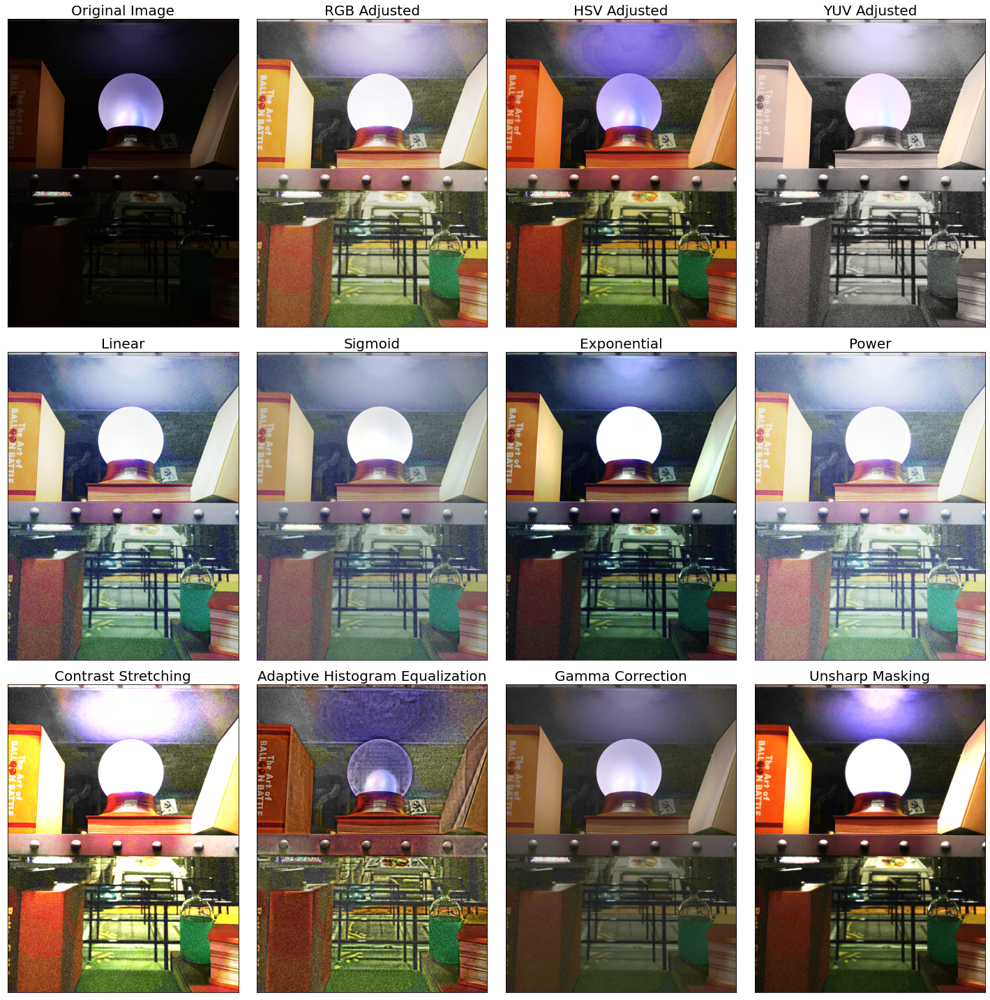

In [20]:
# Plot
fig, axes = plt.subplots(3, 4, figsize=(20, 20))

# Original image
axes[0, 0].imshow(dark_image)
axes[0, 0].set_title('Original Image', fontsize=20)

# Histogram Equalization: RGB Adjusted
axes[0, 1].imshow(equalized_rgb)
axes[0, 1].set_title('RGB Adjusted', fontsize=20)

# HSV Adjusted
axes[0, 2].imshow(equalized_hsv)
axes[0, 2].set_title('HSV Adjusted', fontsize=20)

# YUV Adjusted
axes[0, 3].imshow(equalized_yuv)
axes[0, 3].set_title('YUV Adjusted', fontsize=20)


# Linear CDF
axes[1, 0].imshow(linear)
axes[1, 0].set_title('Linear', fontsize=20)

# Sigmoid CDF
axes[1, 1].imshow(sigmoid)
axes[1, 1].set_title('Sigmoid', fontsize=20)

# Exponential CDF
axes[1, 2].imshow(exponential)
axes[1, 2].set_title('Exponential', fontsize=20)

# Power CDF
axes[1, 3].imshow(power)
axes[1, 3].set_title('Power', fontsize=20)


# Contrast Stretching
axes[2, 0].imshow(cs_image)
axes[2, 0].set_title('Contrast Stretching', fontsize=20)

# Adaptive Histogram Equalization (CLAHE)
axes[2, 1].imshow(clahe_image)
axes[2, 1].set_title('Adaptive Histogram Equalization', fontsize=20)

# Gamma Correction
axes[2, 2].imshow(gamma_corrected_image)
axes[2, 2].set_title('Gamma Correction', fontsize=20)

# Unsharp Masking
axes[2, 3].imshow(sharpened_image)
axes[2, 3].set_title('Unsharp Masking', fontsize=20)

# Remove axis ticks and labels
for ax in axes.flatten():
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()

Output #7: Plot of the corrected images using various histogram manipulation techniques. Photo by Author.

There are plenty of ways/techniques to correct an image in RGB, but most of them require manual adjustment of the parameters. Output #7 displays a plot of the corrected images generated using various histogram manipulation techniques.

HSV Adjusted, Exponential, Contrast Stretching, and Unsharp Masking all seem satisfactory. Note that the results will vary based on the original image used. Depending on the specific image, you can experiment with different parameter values to achieve your desired image quality.

Histogram manipulation techniques can greatly enhance the contrast and overall appearance of an image. However, it is important to use them with care, as they can also introduce artifacts and result in an unnatural appearance if overused, as evident from some of the techniques used in Output #7 (e.g., Adaptive Histogram Equalization with a grainy background and overemphasized edges).

In contrast to the dark image used above, I also tried executing my codes, with the same parameter values, on a bright image. Let’s observe what happened here:

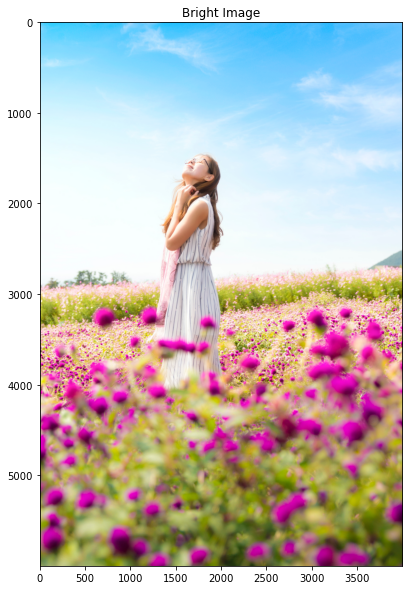

In [28]:
bright_image = imread('image1.jpg')[:,:,:3]
plt.figure(figsize=(15,10))
plt.subplot(1, 2, 1)
plt.imshow(bright_image)
plt.title("Bright Image")
plt.show();

In [30]:
%%capture
# Save each technique to a variable
linear = custom_rgb_adjustment(bright_image, np.linspace(0, 1, len(target_bins)))
sigmoid = custom_rgb_adjustment(bright_image, sigmoid_cdf((target_bins - 128) / 64, a=1))
exponential = custom_rgb_adjustment(bright_image, exponential_cdf(target_bins / 255, alpha=3))
power = custom_rgb_adjustment(bright_image, power_law_cdf(target_bins / 255, alpha=2))

clahe_image = adaptive_histogram_equalization(
    bright_image, clip_limit=0.09, tile_size=(50, 50))
gamma_corrected_image = gamma_correction(bright_image, gamma=0.4)
sharpened_image = unsharp_masking(bright_image, radius=10, amount=-0.98)
cs_image = contrast_stretching_percentile(bright_image, 0, 70)

equalized_rgb = equalize_hist_rgb(bright_image)
equalized_hsv = equalize_hist_hsv(bright_image)
equalized_yuv = equalize_hist_yuv(bright_image)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


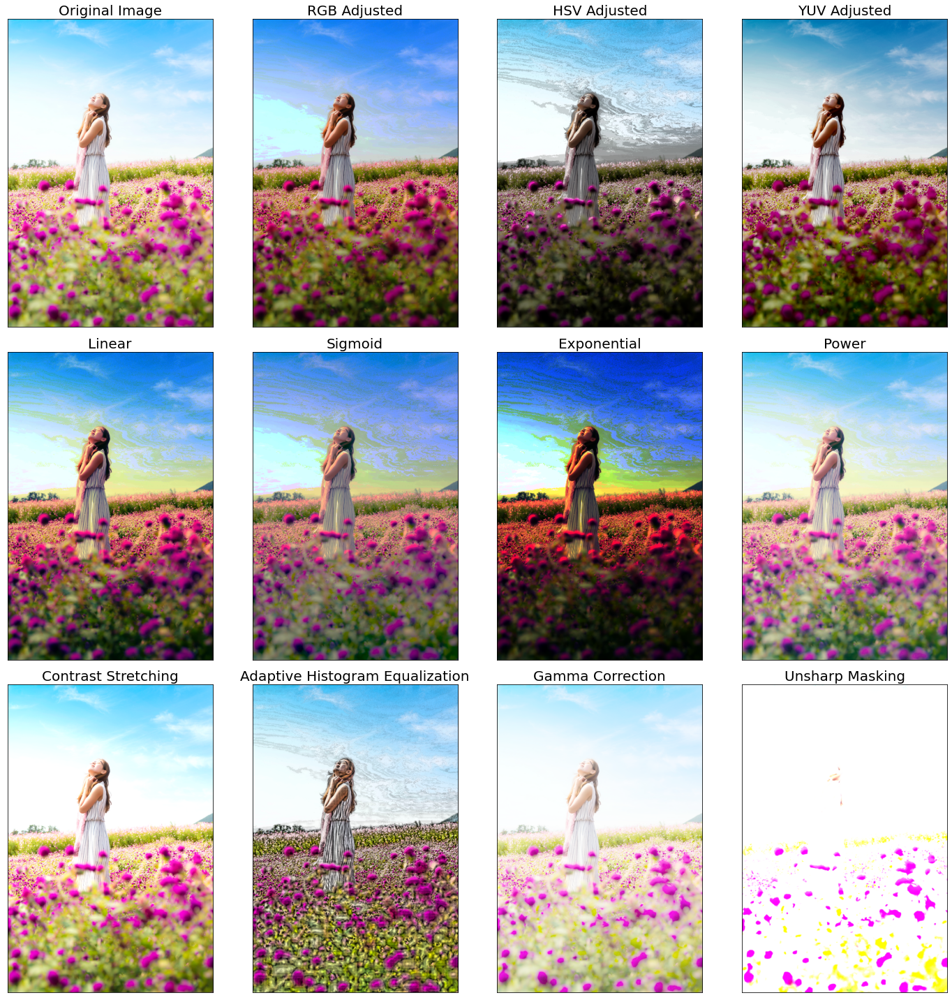

In [31]:
# Plot
fig, axes = plt.subplots(3, 4, figsize=(20, 20))

# Original image
axes[0, 0].imshow(bright_image)
axes[0, 0].set_title('Original Image', fontsize=20)

# Histogram Equalization: RGB Adjusted
axes[0, 1].imshow(equalized_rgb)
axes[0, 1].set_title('RGB Adjusted', fontsize=20)

# HSV Adjusted
axes[0, 2].imshow(equalized_hsv)
axes[0, 2].set_title('HSV Adjusted', fontsize=20)

# YUV Adjusted
axes[0, 3].imshow(equalized_yuv)
axes[0, 3].set_title('YUV Adjusted', fontsize=20)


# Linear CDF
axes[1, 0].imshow(linear)
axes[1, 0].set_title('Linear', fontsize=20)

# Sigmoid CDF
axes[1, 1].imshow(sigmoid)
axes[1, 1].set_title('Sigmoid', fontsize=20)

# Exponential CDF
axes[1, 2].imshow(exponential)
axes[1, 2].set_title('Exponential', fontsize=20)

# Power CDF
axes[1, 3].imshow(power)
axes[1, 3].set_title('Power', fontsize=20)


# Contrast Stretching
axes[2, 0].imshow(cs_image)
axes[2, 0].set_title('Contrast Stretching', fontsize=20)

# Adaptive Histogram Equalization (CLAHE)
axes[2, 1].imshow(clahe_image)
axes[2, 1].set_title('Adaptive Histogram Equalization', fontsize=20)

# Gamma Correction
axes[2, 2].imshow(gamma_corrected_image)
axes[2, 2].set_title('Gamma Correction', fontsize=20)

# Unsharp Masking
axes[2, 3].imshow(sharpened_image)
axes[2, 3].set_title('Unsharp Masking', fontsize=20)

# Remove axis ticks and labels
for ax in axes.flatten():
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()

Output #8: Original Photo by Johen Redman on Unsplash, other processed images performed by the Author.

As you may have noticed, most of the techniques that worked well for the dark image did not work well for the bright image. Techniques such as HSV Adjusted, Exponential, and Unsharp Masking performed worse and added artifacts or noise to the image. This could be due to the fact that these techniques may enhance or amplify the existing brightness in the image, leading to overexposure or the addition of artifacts or noise.

However, it is good to know that <b>Contrast Stretching</b>, despite making some parts brighter than the original image as expected, since contrast stretching literally expands the range of pixel values in an image to increase overall contrast, provides a more flexible solution that can be used for both bright and dark images.

---
<h2 style="color:#ff0090">Conclusion</h2>

In this episode, we’ve delved deeper into the world of image processing, exploring various image enhancement techniques. We covered Fourier Transform (Part 1), White Balancing Algorithms (Part 2), and Histogram Manipulation techniques (Part 3, this part), along with relevant Python code using the skimage library.

Ultimately, the choice of the most suitable image enhancement techniques depends on the specific image and your output quality requirements. As a best practice, experiment with multiple image enhancement techniques and adjust different parameter values to achieve the desired image quality. I hope this exploration helped you gain a better understanding of the impact of various image enhancement techniques.

As we continue this exciting journey into image processing, there’s still much more to learn and explore. Stay tuned for the next installment of my Introduction to Image Processing with Python series, where I’ll discuss even more advanced techniques and applications!